---
Workflow Overview: Concept relevance propagation method 
---

### Additional Comments
### Author: Viswambhar Yasa

### Date: 09-01-2024

**Contact Information:**  
Email: [yasa.viswambhar@gmail.com](mailto:yasa.viswambhar@gmail.com)

<p align="center">
  <img src="./figures/conceptflowcart.drawio.png" alt="overview">
</p>


In [1]:
import os
import sys
import math
import torch
import pickle
from PIL import Image
from pathlib import Path

import torch.nn.functional as F
import matplotlib.pyplot as plt
from crp.image import imgify,vis_opaque_img

In [65]:
notebook_directory = Path().resolve().parent
sys.path.insert(0,str(notebook_directory.parent))
from sentinelmodels.preprocessing import SentinelDataset
from sentinelmodels.pretrained_models import buildmodel
from interpret.concept.conceptrelevance import ConceptRelevance
from experiment.helper_functions import load_dict,plot_and_annotate_max_min_index,get_info,generate_layer_heatmap,visualize_layerheatmap, create_bar_chart


### Input data selection

In [20]:
config={    
            "root_dir":r'D:/master-thesis/Dataset/anthroprotect',
            "datasplitfilename": r"infos.csv",
            "n_classes":2,
            "filepath":r'./wilderness_concepts/data/',
            "filename":r"wilderness_datasample.pkl",
            "datasaved":True,
            "device":"cpu",
            "datasettype":"val",
            "filterclass":None,
            "models":["alexnet","vgg16","resnet18"],
            "modelweightpathspretrained":[r"D:/Thesis/ExplainingWilderness/experiments/figures/trained_models/pretrained/alexnet_best_model.pth",
                                r"D:/Thesis/ExplainingWilderness/wandb/run-20231214_015923-rjpkfmb8/files/vgg16/best_model.pth",
                                r"D:/Thesis/ExplainingWilderness/experiments/figures/trained_models/pretrained/resnet18_best_model.pth",
                                ],
            "modelweightpaths":[r"D:/Thesis/ExplainingWilderness/experiments/figures/trained_models/wilderness_model/alexnet_best_model.pth",
                                r"D:/Thesis/ExplainingWilderness/wandb/run-20231215_152207-vfamzdp1/files/vgg16/best_model.pth",
                                r"D:/Thesis/ExplainingWilderness/experiments/figures/trained_models\wilderness_model/resnet18\best_model.pth"
                                ],
            "compositname":["epsilonplus"]
            }

modelindex=0
datafilepath=r"D:/finaldraft/ExplainingWilderness/experiment/Notebooks/data/wilderness_data.pkl"

loaded_data = dictionary = load_dict(datafilepath)
# Accessing the loaded images and labels
images = loaded_data["images"][0,:,:,:].unsqueeze(dim=0).to(config["device"])
#images = loaded_data["images"].to(config["device"])

labels = loaded_data["labels"]


### Building a deep neural network and creating a concept relevance class

In [21]:
index=0
model=buildmodel(model_type=config["models"][index],multiclass_channels=config["n_classes"],modelweightpath=config["modelweightpathspretrained"][index]).to(config["device"])
Concepts=ConceptRelevance(model,device=config["device"])
del model

### Step-1 : Initial Layer wise propagation

In [57]:
record_layer=list(Concepts.layer_map.keys())
print(record_layer)

['features.0', 'features.3', 'features.6', 'features.8', 'features.10', 'classifier.1', 'classifier.4', 'classifier.6', 'classifier.9', 'classifier.12', 'classifier.15']


In [58]:
lrpheatmap,init_relevance,prediction=Concepts.conditional_relevance(images,condition=[{"y":[0,1]}],compositename="epsilonplus",canonizerstype=config["models"][index],output_type="max",record_layer=record_layer)

(-0.5, 255.5, 255.5, -0.5)

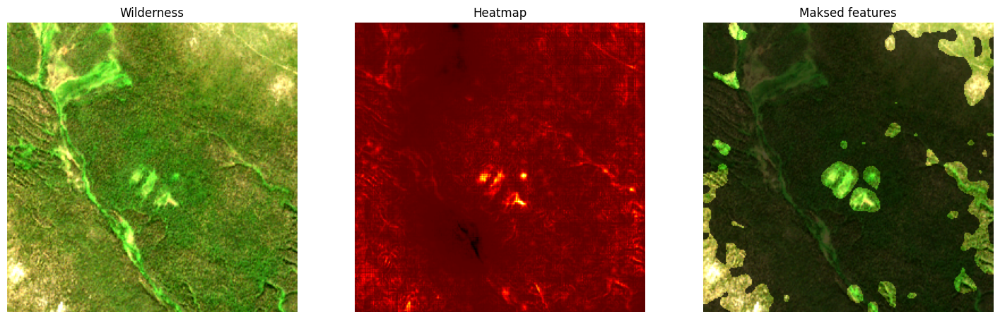

In [59]:
fig,ax=plt.subplots(1,3,figsize=(18,12))
ax[0].imshow(images.squeeze(dim=0).permute(1,2,0).detach().cpu().numpy())
ax[0].set_title("Wilderness")
ax[0].axis("off")
ax[1].imshow(imgify(lrpheatmap.detach().cpu().numpy(), cmap="hot", symmetric=False, level=1))
ax[1].set_title("Heatmap")
ax[1].axis("off")
ax[2].imshow(vis_opaque_img(images, lrpheatmap,alpha=0.3)[0])
ax[2].set_title("Maksed features")
ax[2].axis("off")

### step-2 Relevance Analysis

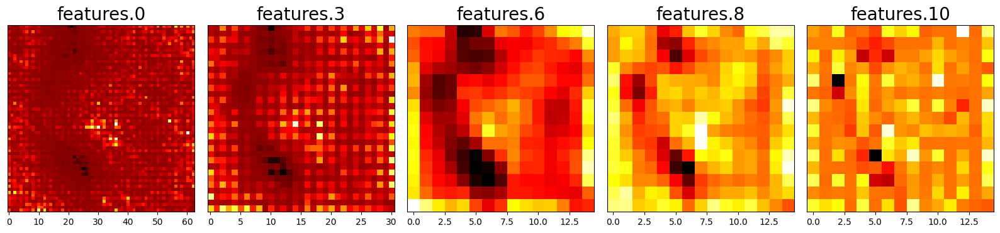

In [64]:
saved_path="./temp"
relevance_feature_map=generate_layer_heatmap(init_relevance,cmap="hot",symmetric=False,level=1)
visualize_layerheatmap(relevance_feature_map,title="",recordlayers=['features.0', 'features.3', 'features.6', 'features.8', 'features.10'],filepath=os.path.join(saved_path,"workflowlrp.png"),rows=1,columns=5,figsize=(16,8),fontsize=20)

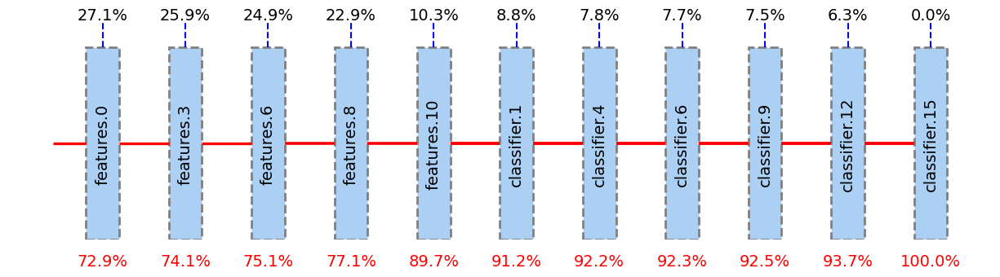

In [67]:
meanvalue={}
index=0
featuresinfo=get_info(init_relevance)
for i,value in featuresinfo.items():
    newparts = i.replace('downsample.0', 'down')
    if 'down' not in newparts:
        meanvalue[newparts]=value["meanrel"]*100

create_bar_chart(meanvalue,os.path.join(saved_path,"alexnetlrp_relevanceflow.png"),figheight=3.5)

(-15.0, 275.0)

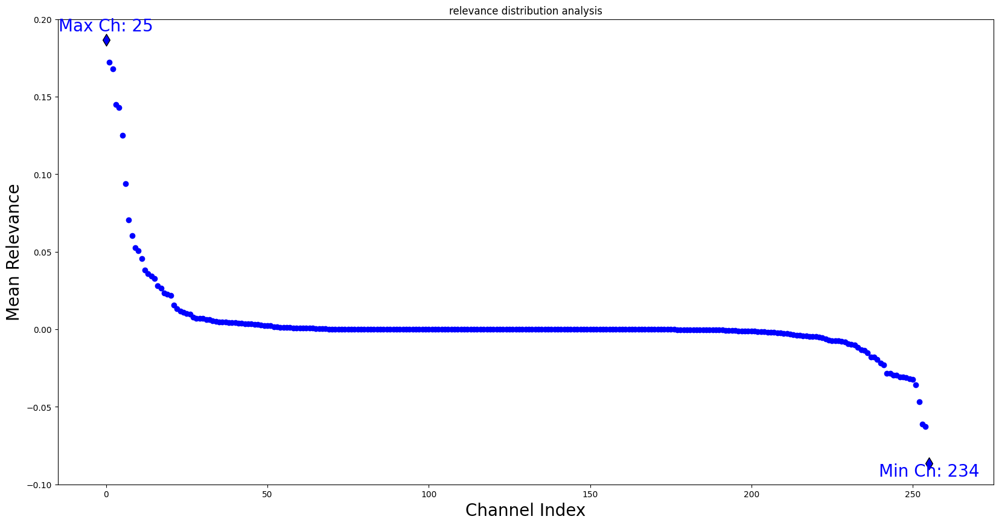

In [84]:
plt.figure(figsize=(20,10))
plot_and_annotate_max_min_index(featuresinfo["features.10"]['channelmean'], "AlexNet (mean relevance:"+str(round(featuresinfo["features.10"]['meanrel'],2)*100)+"%)", 'blue', 'o',fontsize=20)
plt.title("Relevance Distribution Analysis")
plt.xlabel("Channel Index",fontsize=20)
plt.ylabel("Mean Relevance",fontsize=20)
plt.ylim(-0.1,0.20)
plt.xlim(-15,275)

In [86]:
layer_name="features.10"
conditions=[{"y":[0,1],layer_name:[25]},{"y":[0,1],layer_name:[234]}]
minmaxheatmap,_,_=Concepts.conditional_relevance(images,condition=conditions,compositename="epsilonplus",canonizerstype=config["models"][index],output_type="max",record_layer=['features.0', 'features.3', 'features.6', 'features.8','features.10'])

In [92]:
minmaxheatmap.shape

torch.Size([2, 256, 256])

(-0.5, 511.5, 255.5, -0.5)

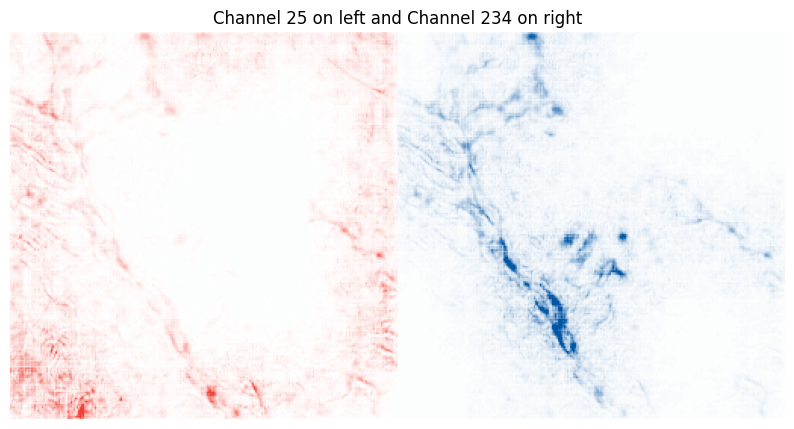

In [97]:
plt.figure(figsize=(10,10))
plt.imshow(imgify(minmaxheatmap.squeeze(dim=0).to("cpu").numpy(),cmap="france", symmetric=True,level=2,grid=(1,minmaxheatmap.shape[0])))
plt.title("Channel 25 on left and Channel 234 on right")
plt.axis('off')

### step-4 Running Concept relevance propagation for a layer using 'AND'

In [38]:
layer_name="features.10"
conditions=[]
conditions += [{"y": [1], layer_name: [channel]} for channel in range(0,256,2)]

In [39]:
heatmap,relevance,p=Concepts.conditional_relevance(images,condition=conditions,compositename="epsilonplus",canonizerstype=config["models"][index],output_type="max",record_layer=['features.0', 'features.3', 'features.6', 'features.8','features.10'])

In [40]:
c={}
for i in range(0,len(heatmap)):
    channelrel=heatmap[i].sum()
    if  channelrel>0:
        c[i]=[imgify(heatmap[i].unsqueeze(dim=0).to("cpu").numpy(),cmap="france", symmetric=True,level=2),channelrel]

In [42]:
num_images = len(list(c.keys()))
print(num_images)

45


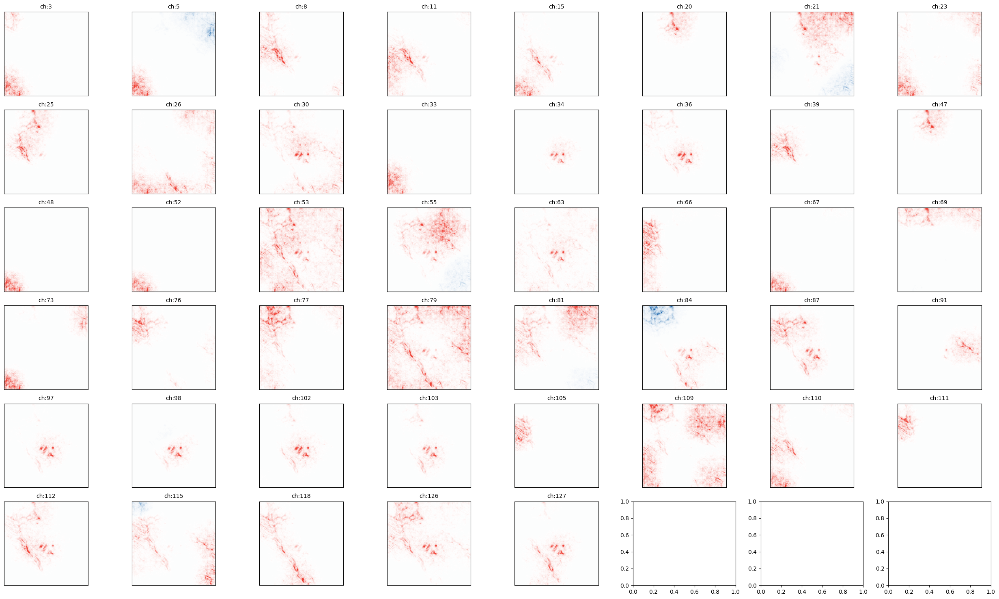

In [52]:
# Assuming 'c' is a dictionary with keys and image data
columns = 8
rows = 6
figsize = (25, 15)
fontsize = 10
title = ""

if columns is None:
    columns = int(math.ceil(math.sqrt(num_images)))
if rows is None:
    rows = int(math.ceil(num_images / columns))
if figsize is None:
    figsize = (10 * columns, 15 * rows)

fig, axes = plt.subplots(rows, columns, figsize=figsize)
fig.suptitle(title, fontsize=fontsize)

for i, (layer, layerrel) in enumerate(c.items()):
    ax = axes.flatten()[i] if num_images > 1 else axes
    ax.imshow(layerrel[0])  # Display the image
    ax.set_title("ch:"+str(layer), fontsize=fontsize)  # Set the subplot title
    ax.axis('on')  # Turn on the axis
    ax.get_yaxis().set_visible(False)
    ax.get_xaxis().set_visible(False)

plt.tight_layout()
plt.show()


### step-5 and step-6 Identifying concept within each layer (Relevance Maximization)

In [102]:
batchimages=loaded_data["images"].to(config["device"])
batchimages.requires_grad=True
Concepts.visualize_concepts(batchimages,condition=[{"y":[1]}],compositename="epsilonplus",canonizerstype=config["models"][index],output_type="max",record_layer=record_layer,relevance_type="positive",topk_c=3,filepath="referenceimages/resentepsilonplusall",filename="concepts",cmap="hot",symmetric=False,level=1,figsize=(20,10))

Processing classifier.15:   0%|          | 0/4 [00:00<?, ?it/s]d:\finaldraft\ExplainingWilderness\thesis\Lib\site-packages\zennit\image.py:187: RuntimeWarning: invalid value encountered in divide
  array = (array - vmin) / (vmax - vmin)
Processing classifier.15: 100%|██████████| 4/4 [00:01<00:00,  2.31it/s]


Step-7 Basef on the indices identified from above analysis we generate reference images from training dataset

### step-9 Building reference Images

In [103]:
csvfile=os.path.join( config["root_dir"],config["datasplitfilename"])

In [106]:
preprocessing=None
filepath=os.path.join(config["root_dir"],config["datasplitfilename"])
dataset= SentinelDataset(filepath,config["root_dir"],output_channels=config["n_classes"],datasettype="train",device=config["device"])
filesavepath="referenceimages/wilderness_concepts/alexnet_concepts"
Concepts.build_reference_images(dataset,preprocessing,filesavepath,compositename="epsilonplus",canonizerstype=None,device=config["device"],imagecache=True,imagecachefilepath="cache",max_target="max",build=True,batch_size=8,chkpoint=50)

Running Analysis...


100%|██████████| 299/299 [11:00<00:00,  2.21s/it]


100%|██████████| 77/77 [00:04<00:00, 16.66it/s]


### step-8 To avoid building the reference images each time, we precompute reference image for all layers and channels

In [107]:
Concepts.precompute_reference_images(compositename="epsilonplusflat", canonizerstype=None, relevance_range=(0,8), imagemode="relevance", receptivefield=False, batch=8)

Layer: features.0


100%|██████████| 64/64 [02:03<00:00,  1.93s/it]


Layer: features.3


100%|██████████| 192/192 [07:29<00:00,  2.34s/it]


Layer: features.6


100%|██████████| 384/384 [15:21<00:00,  2.40s/it]


Layer: features.8


100%|██████████| 256/256 [10:33<00:00,  2.47s/it]


Layer: features.10


100%|██████████| 256/256 [10:51<00:00,  2.55s/it]


Layer: classifier.1


  2%|▏         | 83/4096 [03:46<2:49:00,  2.53s/it]

KeyboardInterrupt: 

### step-10 ,step-3, step-8 are computed within the function based on the parameters

Calculating initial relevance and registering concepts
Identifying the channel index of each layer


Processing classifier.15: 100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


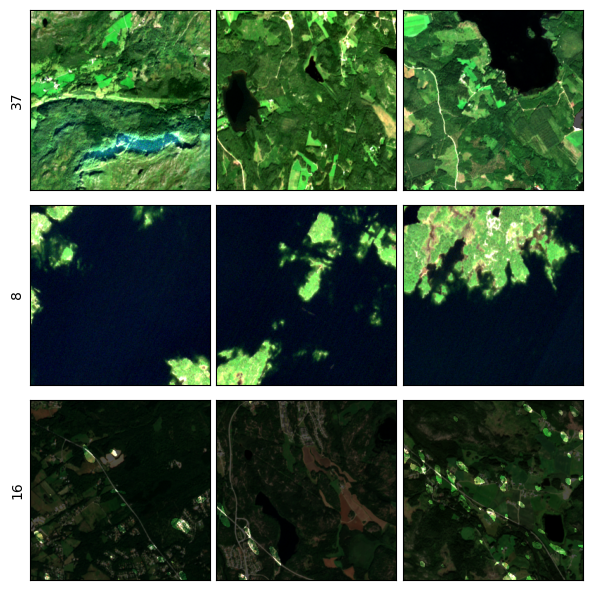

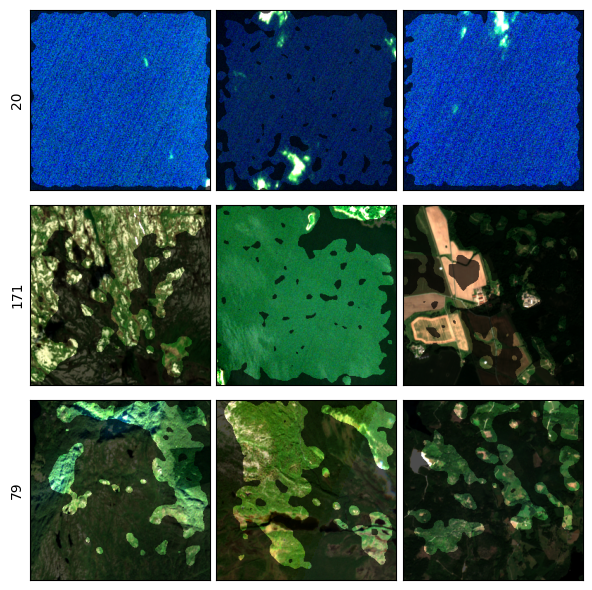

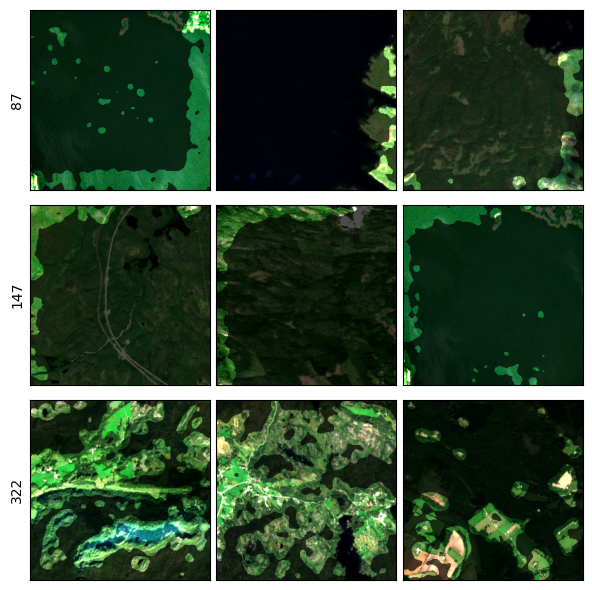

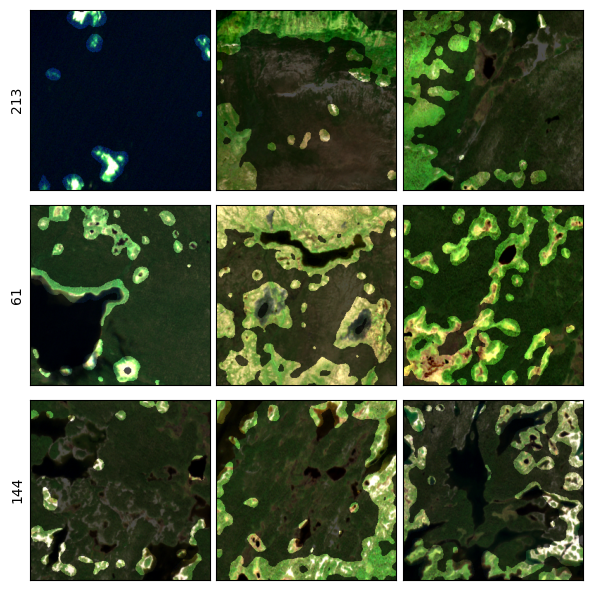

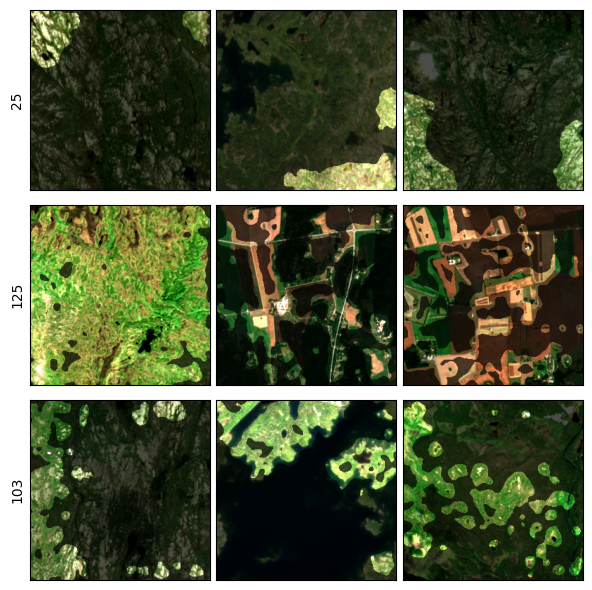

...

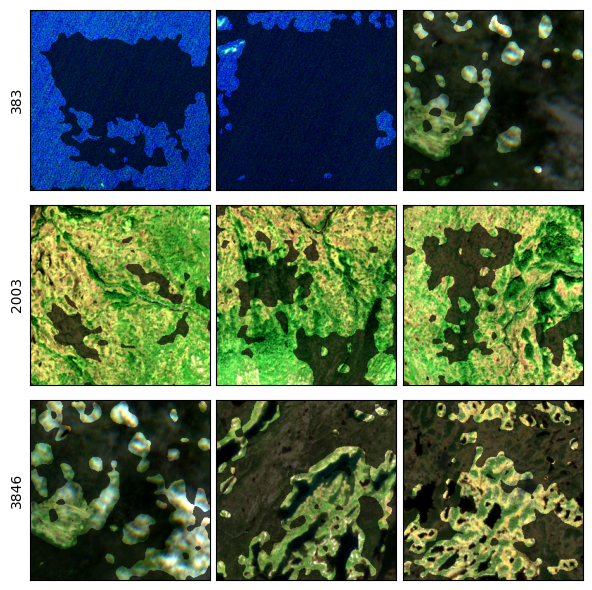

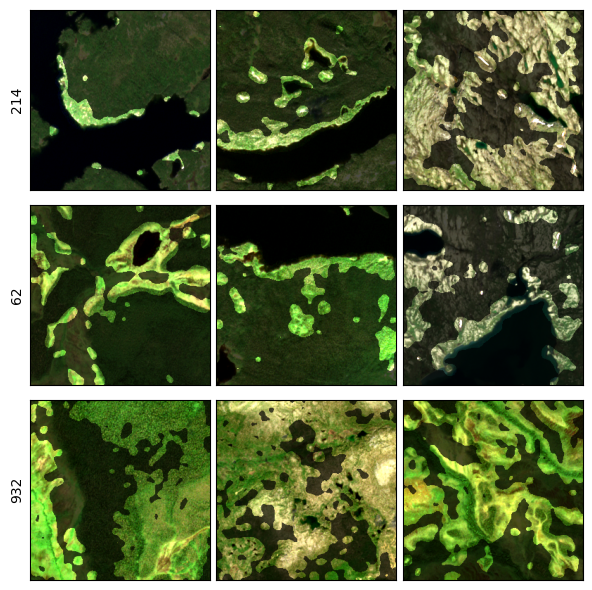

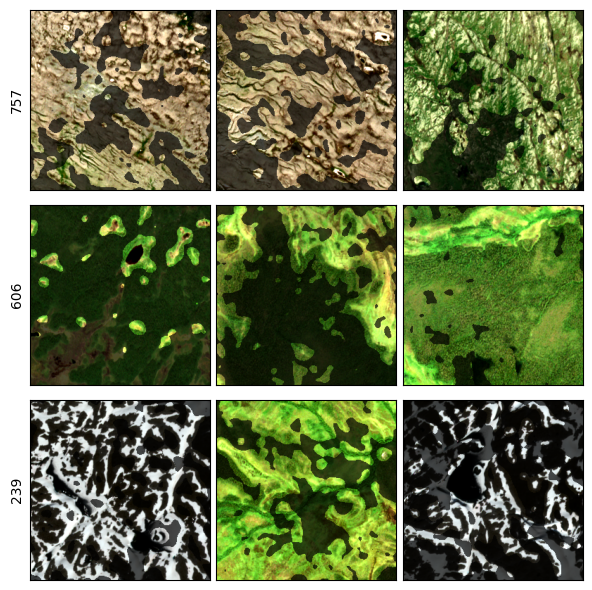

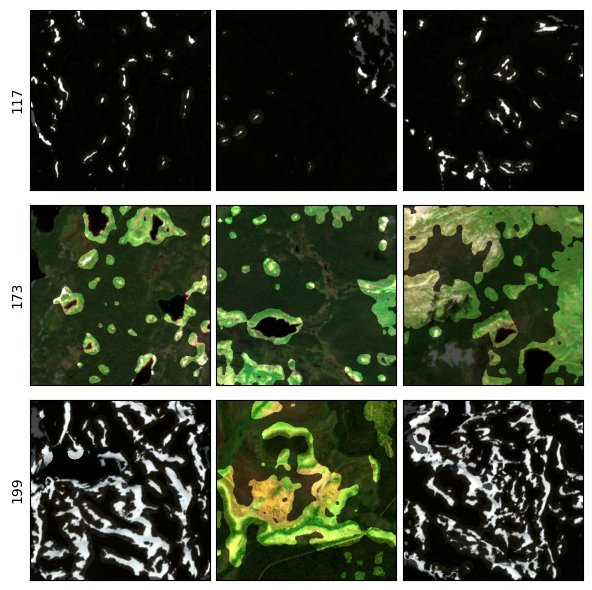

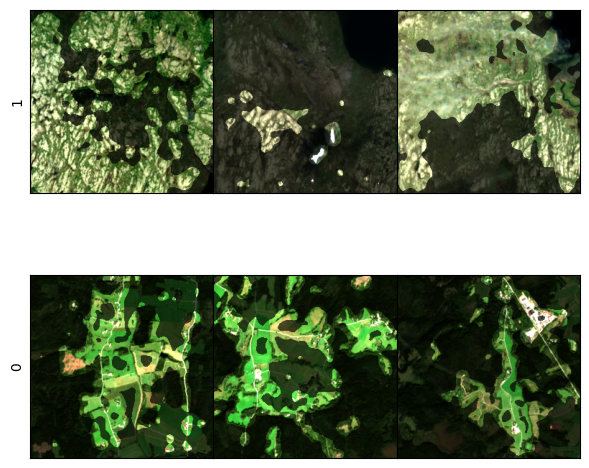

In [108]:
Concepts.concept_reference_images(images,dataset,preprocessing,condition=[{"y":[1]}],compositename="epsilonplusflat",canonizerstype=config["models"][index],output_type="max",filesavepath=filesavepath,refimgsavepath="wilderness_concepts/resnetepsilonplusall/",imagecache=True,record_layer=record_layer,relevance_type="positive",plotfn=vis_opaque_img,topk_c=3,relevance_range=(0,3),imagemode="relevance",receptivefield=False,batch=8)